In [1]:
#!pip install asyncstdlib
!pip install gdown

In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
import gc
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt


# from asyncstdlib.builtins import map
from skimage.io import imread
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from skimage.morphology import label
from sklearn.model_selection import train_test_split 


gc.enable()

In [3]:
os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '1'

strategy = tf.distribute.MirroredStrategy()
print('DEVICES AVAILABLE: {}'.format(strategy.num_replicas_in_sync))

DEVICES AVAILABLE: 1


In [4]:
# Train and test directories
train_image_dir = '/kaggle/input/airbus-ship-detection/train_v2/'
test_image_dir = '/kaggle/input/airbus-ship-detection/test_v2/'
LABELS = '/kaggle/input/airbus-ship-detection/train_ship_segmentations_v2.csv'


# Parameters / CONST
ORIG_IMG_SIZE = 768
BATCH_SIZE = 4                 # Train batch size (4)
EDGE_CROP = 16                 # While building the model (16)
NB_EPOCHS = 1                  # Training epochs. (5)
GAUSSIAN_NOISE = 0.1           # To be used in a layer in the model
UPSAMPLE_MODE = 'DECONV'       # SIMPLE ==> UpSampling2D, else DECONV ==> Conv2DTranspose
NET_SCALING = None             # Downsampling inside the network  (None)                       
IMG_SCALING = (1, 1)           # Downsampling in preprocessing (1, 1)
VALID_IMG_COUNT = 256          # Valid batch size (256)
MAX_TRAIN_STEPS = 128          # Maximum number of steps_per_epoch in training (200)

train_images = os.listdir(train_image_dir)
train_images.sort()
print(f"Total of {len(train_images)} images in train_dir.\nFirst 5 train_images list: {train_images[:5]}")

Total of 192556 images in train_dir.
First 5 train_images list: ['00003e153.jpg', '0001124c7.jpg', '000155de5.jpg', '000194a2d.jpg', '0001b1832.jpg']


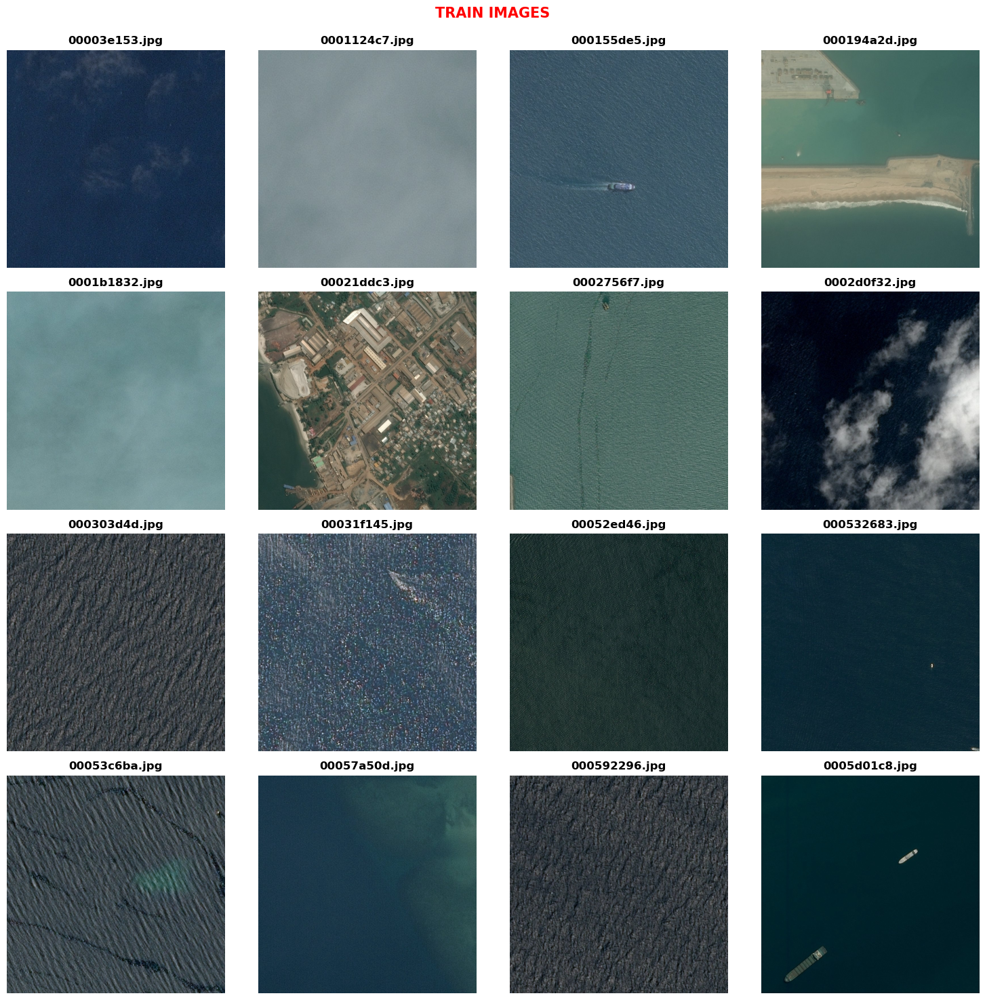

In [5]:
# Using loop to generate images to understand how data looks like
plt.figure(figsize=(15,15))
plt.suptitle('TRAIN IMAGES\n', weight = 'bold', fontsize = 15, color = 'r')
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(imread(train_image_dir + "/" + train_images[i]))
    plt.title(f"{train_images[i]}", weight = 'bold')
    plt.axis('off')
plt.tight_layout()

In [6]:
# Train ships segmented masks
masks = pd.read_csv(LABELS)
masks.head(5)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


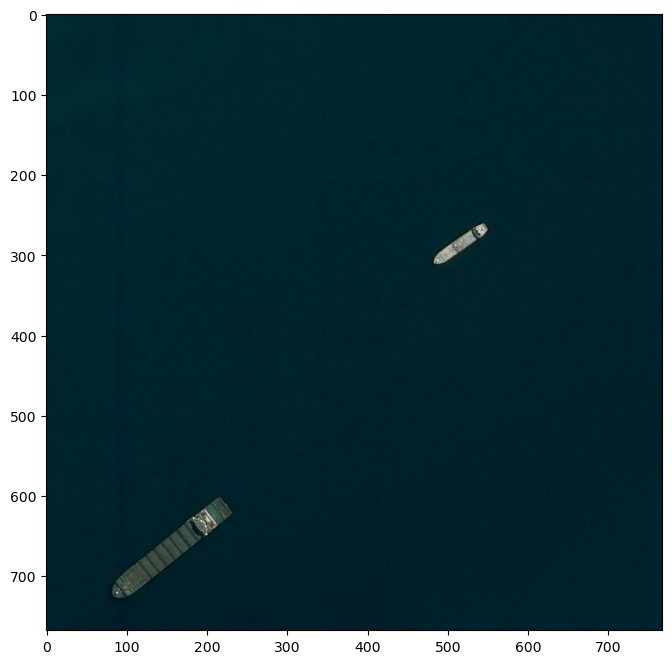

In [7]:
# Let's see how it works for Image ID 0005d01c8.jpg we have in the mask data frame

img_arr = imread(train_image_dir + '/' + '0005d01c8.jpg')
plt.figure(figsize=(15,8))
plt.imshow(img_arr)
plt.show()

In [8]:
img_arr.shape

(768, 768, 3)

In [9]:
# Filter out all 0005d01c8.jpg image IDs and respective encoded data 
# 2 ships means 2 same image ids will be there
rle_0 = masks.query('ImageId=="0005d01c8.jpg"')['EncodedPixels']
rle_0

29    56010 1 56777 3 57544 6 58312 7 59079 9 59846 ...
30    365871 1 366638 3 367405 6 368173 7 368940 9 3...
Name: EncodedPixels, dtype: object

In [10]:
# Make a list of each mask shown above also visualise whats happening
mask_lst, ct = [], 1
for mask in rle_0:
    print(f"Mask {ct} -\n{mask}\n\n")
    mask_lst.append(mask)
    ct += 1

Mask 1 -
56010 1 56777 3 57544 6 58312 7 59079 9 59846 11 60613 14 61380 16 62148 17 62915 19 63682 22 64449 24 65216 26 65984 27 66751 30 67518 32 68285 34 69052 36 69820 38 70587 40 71354 42 72121 42 72888 42 73656 42 74423 42 75190 42 75957 42 76724 42 77492 42 78259 42 79026 42 79793 42 80560 42 81328 42 82095 42 82862 42 83629 42 84396 42 85164 42 85931 42 86698 42 87465 42 88232 42 89000 42 89767 42 90534 42 91301 42 92068 42 92836 42 93603 42 94370 42 95137 42 95904 42 96672 42 97439 42 98206 42 98973 42 99740 42 100508 42 101275 42 102042 42 102809 42 103576 42 104344 42 105111 42 105878 42 106645 42 107412 42 108180 42 108947 42 109714 42 110481 42 111249 41 112016 42 112783 42 113550 42 114317 42 115085 41 115852 42 116619 42 117386 42 118153 42 118921 41 119688 42 120455 42 121222 42 121989 42 122757 41 123524 42 124291 42 125058 42 125825 42 126593 42 127360 42 128127 42 128894 42 129661 42 130429 42 131196 42 131963 42 132730 42 133497 42 134265 42 135032 42 135799 42 1365

In [11]:
# Split and display first mask
split = mask_lst[0].split()
print(split)

['56010', '1', '56777', '3', '57544', '6', '58312', '7', '59079', '9', '59846', '11', '60613', '14', '61380', '16', '62148', '17', '62915', '19', '63682', '22', '64449', '24', '65216', '26', '65984', '27', '66751', '30', '67518', '32', '68285', '34', '69052', '36', '69820', '38', '70587', '40', '71354', '42', '72121', '42', '72888', '42', '73656', '42', '74423', '42', '75190', '42', '75957', '42', '76724', '42', '77492', '42', '78259', '42', '79026', '42', '79793', '42', '80560', '42', '81328', '42', '82095', '42', '82862', '42', '83629', '42', '84396', '42', '85164', '42', '85931', '42', '86698', '42', '87465', '42', '88232', '42', '89000', '42', '89767', '42', '90534', '42', '91301', '42', '92068', '42', '92836', '42', '93603', '42', '94370', '42', '95137', '42', '95904', '42', '96672', '42', '97439', '42', '98206', '42', '98973', '42', '99740', '42', '100508', '42', '101275', '42', '102042', '42', '102809', '42', '103576', '42', '104344', '42', '105111', '42', '105878', '42', '10664

In [12]:
# Grab all the starting pixels and lenghts and convert it into integers 
starts, lengths = [np.array(x, dtype = int) for x in (split[::2], split[1::2])]
starts, lengths

(array([ 56010,  56777,  57544,  58312,  59079,  59846,  60613,  61380,
         62148,  62915,  63682,  64449,  65216,  65984,  66751,  67518,
         68285,  69052,  69820,  70587,  71354,  72121,  72888,  73656,
         74423,  75190,  75957,  76724,  77492,  78259,  79026,  79793,
         80560,  81328,  82095,  82862,  83629,  84396,  85164,  85931,
         86698,  87465,  88232,  89000,  89767,  90534,  91301,  92068,
         92836,  93603,  94370,  95137,  95904,  96672,  97439,  98206,
         98973,  99740, 100508, 101275, 102042, 102809, 103576, 104344,
        105111, 105878, 106645, 107412, 108180, 108947, 109714, 110481,
        111249, 112016, 112783, 113550, 114317, 115085, 115852, 116619,
        117386, 118153, 118921, 119688, 120455, 121222, 121989, 122757,
        123524, 124291, 125058, 125825, 126593, 127360, 128127, 128894,
        129661, 130429, 131196, 131963, 132730, 133497, 134265, 135032,
        135799, 136566, 137333, 138101, 138868, 139635, 140402, 

In [13]:
# Get the ending pixels
'''Examples: 
56010 1 ---> Starts at 56010 and ends at 56010
56777 3 ---> Starts at 56777 and ends at 56779
57544 6 ---> Starts at 57544 and ends at 57549'''

ends = starts + lengths - 1
pd.DataFrame({
    'Starts' : starts,
    'Lengths' : lengths,
    'Ends' : ends
}).head(5)

,Starts,Lengths,Ends
0,56010,1,56010
1,56777,3,56779
2,57544,6,57549
3,58312,7,58318
4,59079,9,59087


In [14]:
# Create 1s in place of these pixels and rest should be 0

img = np.zeros(ORIG_IMG_SIZE*ORIG_IMG_SIZE, dtype = np.uint8)
for start, end in zip(starts, ends):
    img[start:end+1] = 1

In [15]:
# Check output

img[56776:56781] # Should output 0, 1 , 1, 1 ,0 as we know 56777, 56778, 56779 ---> 1 and 5676, 56780 ---> 0

array([0, 1, 1, 1, 0], dtype=uint8)

In [16]:
# Distribute this idea for another ship in the image

split_1 = mask_lst[1].split()                                                                # Split the mask into start_pixels and lengths
starts, lengths = [np.array(x, dtype = int) for x in (split_1[0:][::2], split_1[1:][::2])]   # Generate arrays from only starts and lengths
ends = starts + lengths - 1                                                                  # Start pixel to end pixel will be start - 1 + length
img1 = np.zeros(768*768, dtype = np.uint8)                                                   # 1D array containing all zeros
for start, end in zip(starts, ends):                                                         # For each start to end pair
    img1[start:end+1] = 1 

In [17]:
# Reshaping both the ship masks and combining it to form the final mask

img = img.reshape(ORIG_IMG_SIZE, ORIG_IMG_SIZE)
img1 = img1.reshape(ORIG_IMG_SIZE, ORIG_IMG_SIZE)
final = img+img1
print(final, '\n\n', final.shape, '\n\n', final.ndim)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] 

 (768, 768) 

 2


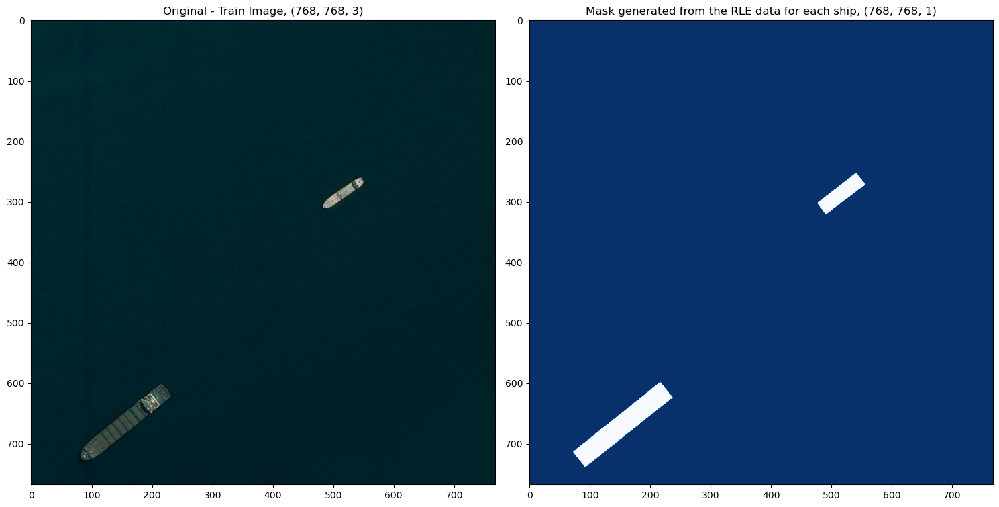

In [18]:
# Expand dimension of this array to have only 1 channel in the mask and visualise original and final mask

img = img.reshape(ORIG_IMG_SIZE, ORIG_IMG_SIZE).T       # Transpose the first ship mask
img1 = img1.reshape(ORIG_IMG_SIZE, ORIG_IMG_SIZE).T     # Transpose the second ship mask
original = imread(train_image_dir+'/'+train_images[15])
final = img+img1                                        # Generate the final mask with two ships 
final = np.expand_dims(final, -1)                       # -1 means the last available dimenstion, in this case it is 2. Hence, on axis = 2 we will get 1.
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image, {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship, {final.shape}")
plt.imshow(final, cmap = "Blues_r")
plt.tight_layout()
plt.show()

In [19]:
# Define functions to do these tasks for all the training images

def rle_decode(mask_rle, shape=(ORIG_IMG_SIZE,ORIG_IMG_SIZE)):
    '''
    Input arguments -
    mask_rle: Mask of one ship in the train image
    shape: Output shape of the image array
    '''
    s = mask_rle.split()                                                               # Split the mask of each ship that is in RLE format
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]     # Get the start pixels and lengths for which image has ship
    ends = starts + lengths - 1                                                        # Get the end pixels where we need to stop
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)                                  # A 1D vec full of zeros of size = 768*768
    for lo, hi in zip(starts, ends):                                                   # For each start to end pixels where ship exists
        img[lo:hi+1] = 1                                                               # Fill those values with 1 in the main 1D vector
    '''
    Returns -
    Transposed array of the mask: Contains 1s and 0s. 1 for ship and 0 for background
    '''
    return img.reshape(shape).T                                                       

def masks_as_image(in_mask_list):
    '''
    Input - 
    in_mask_list: List of the masks of each ship in one whole training image
    '''
    all_masks = np.zeros((768, 768), dtype = np.int16)                                 # Creating 0s for the background
    for mask in in_mask_list:                                                          # For each ship rle data in the list of mask rle 
        if isinstance(mask, str):                                                      # If the datatype is string
            all_masks += rle_decode(mask)                                              # Use rle_decode to create one mask for whole image
    '''
    Returns - 
    Full mask of the training image whose RLE data has been passed as an input
    '''
    return np.expand_dims(all_masks, -1)

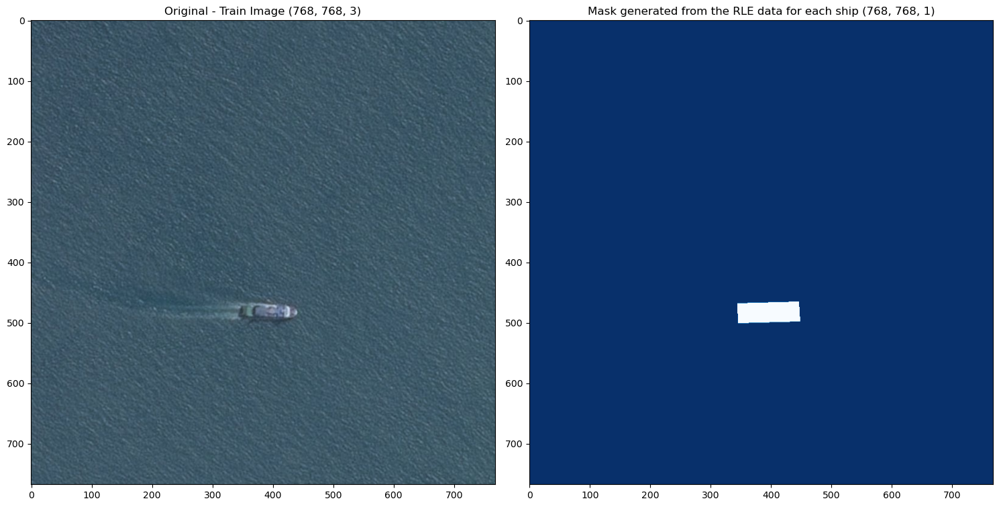

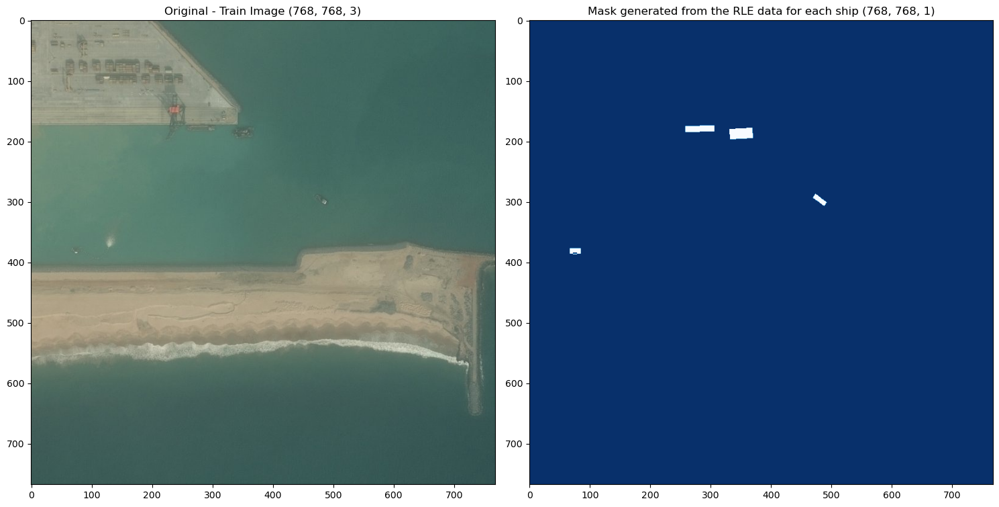

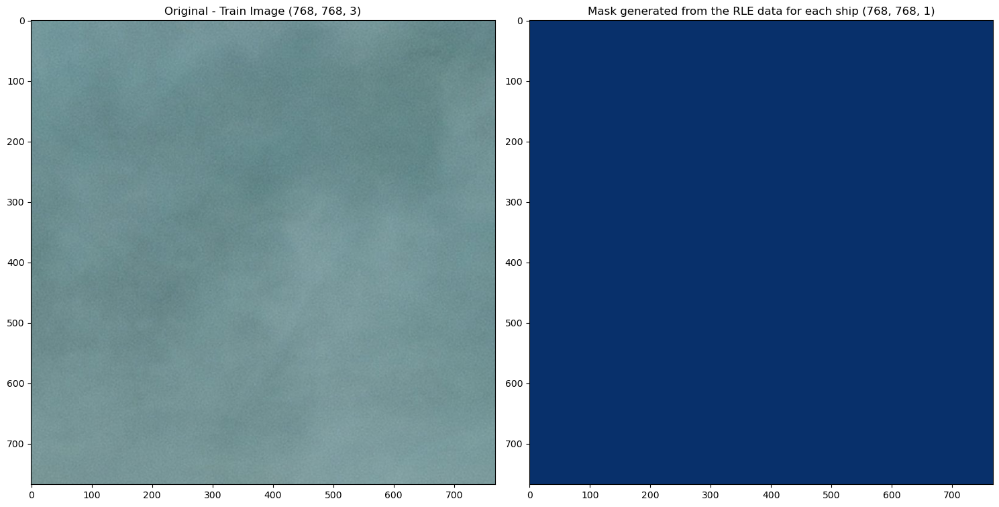

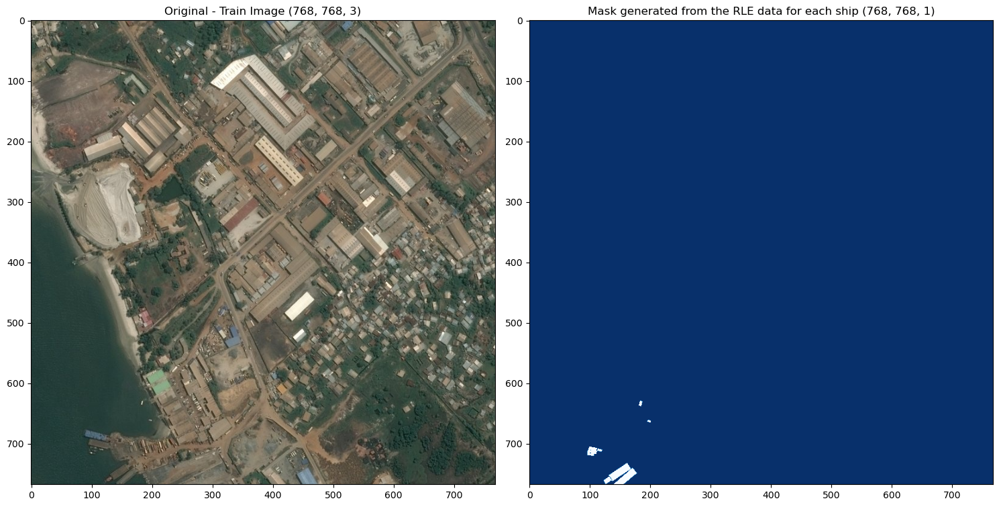

In [20]:
for num in [3, 4, 5, 6]:
    rle_0 = masks.query(f'ImageId=="{train_images[num-1]}"')['EncodedPixels']
    img_0 = masks_as_image(rle_0)
    original = imread(train_image_dir+"/"+train_images[num-1])
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.title(f"Original - Train Image {original.shape}")
    plt.imshow(original)
    plt.subplot(1, 2, 2)
    plt.title(f"Mask generated from the RLE data for each ship {final.shape}")
    plt.imshow(img_0, cmap = "Blues_r")
    plt.tight_layout()
    plt.show()

In [21]:
# Add a new feature to the masks data frame named as ship. If Encoded pixel in any row is a string, there is a ship else there isn't. 

masks['ships'] = masks['EncodedPixels'].map(lambda c_row: 1 if isinstance(c_row, str) else 0)
masks.head(9)

,ImageId,EncodedPixels,ships
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,1
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,1
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,1
8,0001b1832.jpg,NaN,0


In [22]:
# Making a new df with unique image IDs where we are summing up the ship counts

unique_img_ids = masks.groupby('ImageId').agg({'ships': 'sum'}).reset_index() 
unique_img_ids.index+=1 # Incrimenting all the index by 1
unique_img_ids.head()

,ImageId,ships
1,00003e153.jpg,0
2,0001124c7.jpg,0
3,000155de5.jpg,1
4,000194a2d.jpg,5
5,0001b1832.jpg,0


In [23]:
# Adding two new features to unique_img_ids df. If ship exists in image, val is 1 else 0 (vec form)

unique_img_ids['has_ship'] = unique_img_ids['ships'].map(lambda x: 1.0 if x>0 else 0.0)
unique_img_ids.head()

,ImageId,ships,has_ship
1,00003e153.jpg,0,0.0
2,0001124c7.jpg,0,0.0
3,000155de5.jpg,1,1.0
4,000194a2d.jpg,5,1.0
5,0001b1832.jpg,0,0.0


In [24]:
# Check the size of the files. Will take a lot of time to run as there are loads of files

#Uncomment on PROD
# unique_img_ids['file_size_kb'] = unique_img_ids['ImageId'].map(lambda c_img_id: os.stat(os.path.join(train_image_dir, c_img_id)).st_size/1024)
# '''os.stat is used to get status of the specified path. Here, st_size represents size of the file in bytes. Converting it into kB!'''

In [25]:
# import pickle
# with open('unique_img_ids.pkl', 'wb') as fp:
#     pickle.dump(unique_img_ids, fp)
#     print('unique_img_ids dictionary saved successfully dumped')

#COMMENT CODE ON PROD
import pickle
import gdown

URL_PKL = "https://drive.google.com/uc?id=1t5nKU3jF3GHn9PgXfG0MLLD0QC2xqSCd"
gdown.download(url=URL_PKL, output="unique_img_ids.pkl", quiet=False)

with open('unique_img_ids.pkl', 'rb') as fp:
    unique_img_ids = pickle.load(fp)
    print('unique_img_ids dictionary loaded')

print(unique_img_ids)

Downloading...
From: https://drive.google.com/uc?id=1t5nKU3jF3GHn9PgXfG0MLLD0QC2xqSCd
To: /kaggle/working/unique_img_ids.pkl
100%|██████████| 9.23M/9.23M [00:00<00:00, 122MB/s]

unique_img_ids dictionary loaded
              ImageId  ships  has_ship  file_size_kb
1       00003e153.jpg      0       0.0    128.944336
2       0001124c7.jpg      0       0.0     76.059570
3       000155de5.jpg      1       1.0    147.625977
4       000194a2d.jpg      5       1.0     75.221680
5       0001b1832.jpg      0       0.0     95.627930
...               ...    ...       ...           ...
192552  fffedbb6b.jpg      0       0.0     93.918945
192553  ffff2aa57.jpg      0       0.0    191.762695
192554  ffff6e525.jpg      0       0.0    108.519531
192555  ffffc50b4.jpg      0       0.0     98.344727
192556  ffffe97f3.jpg      0       0.0    113.900391

[192320 rows x 4 columns]


In [26]:
# We can get rid of any images whose size is less than 35 Kb (some of the files are corrupted)

unique_img_ids[unique_img_ids.file_size_kb<35].head()

,ImageId,ships,has_ship,file_size_kb


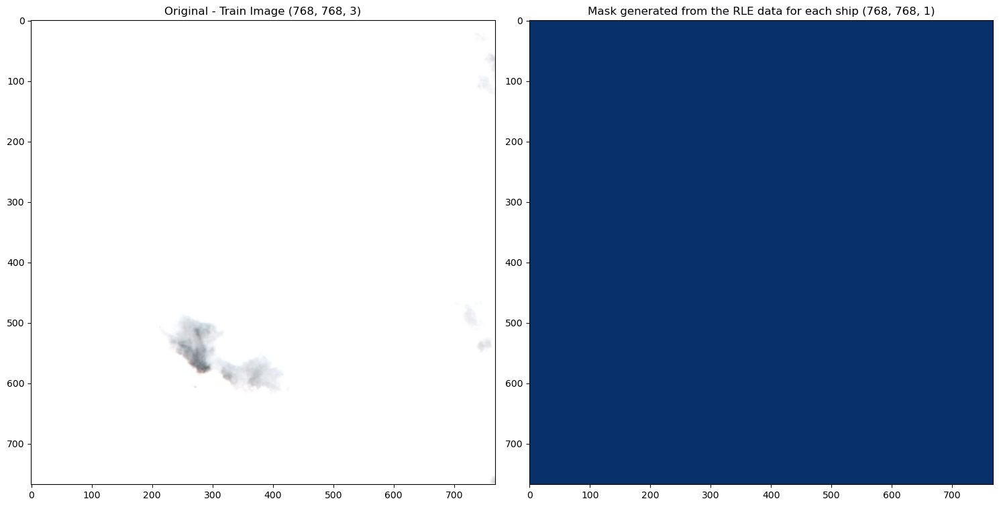

In [27]:
rle_0 = masks.query(f'ImageId=="0318fc519.jpg"')['EncodedPixels']
img_0 = masks_as_image(rle_0)
original = imread(train_image_dir+"/"+'0318fc519.jpg')
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.title(f"Original - Train Image {original.shape}")
plt.imshow(original)
plt.subplot(1, 2, 2)
plt.title(f"Mask generated from the RLE data for each ship {final.shape}")
plt.imshow(img_0, cmap = "Blues_r")
plt.tight_layout()
plt.show()

In [28]:
# Keep the files whose size > 35 kB

unique_img_ids = unique_img_ids[unique_img_ids.file_size_kb > 35]
unique_img_ids.head()

,ImageId,ships,has_ship,file_size_kb
1,00003e153.jpg,0,0.0,128.944336
2,0001124c7.jpg,0,0.0,76.059570
3,000155de5.jpg,1,1.0,147.625977
4,000194a2d.jpg,5,1.0,75.221680
5,0001b1832.jpg,0,0.0,95.627930


In [29]:
unique_img_ids.shape

(192320, 4)

In [30]:
# Retrive the old masks data frame

masks.drop(['ships'], axis=1, inplace=True)
masks.index+=1 
masks.head()

,ImageId,EncodedPixels
1,00003e153.jpg,NaN
2,0001124c7.jpg,NaN
3,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
4,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
5,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [31]:
# Train - Test split
                  
train_ids, valid_ids = train_test_split(unique_img_ids, test_size = 0.3, stratify = unique_img_ids['ships'])

In [32]:
# Create train df

train_df = pd.merge(masks, train_ids)

# Create test df

valid_df = pd.merge(masks, valid_ids)

In [33]:
print('There are:')
print(train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

There are:
162039 training masks,
69447 validation masks.


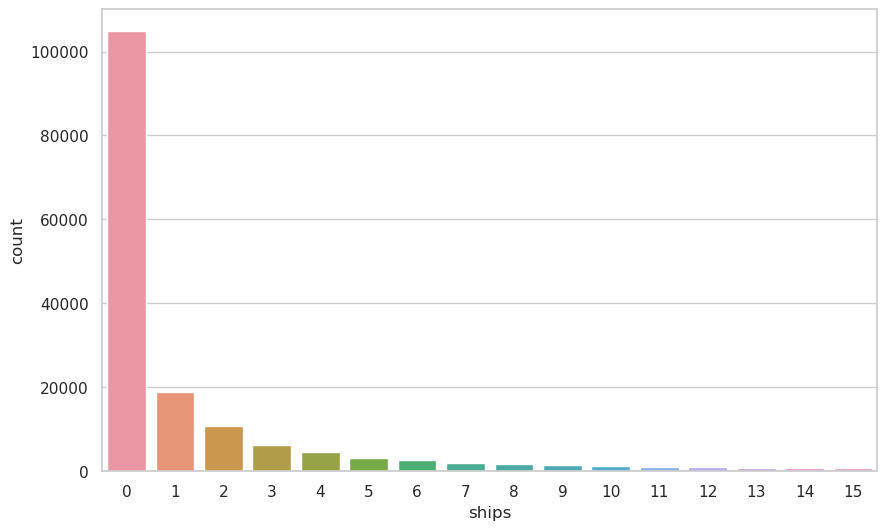

In [34]:
# Visualise ship counts

plt.figure(figsize=(10, 6))
sns.set_theme(style="whitegrid")
sns.countplot(x=train_df.ships)
plt.show()

In [35]:
# Clipping the MAX value of grouped_ship_count to be 7, minimum to be 0

train_df['grouped_ship_count'] = train_df.ships.map(lambda x: (x+1)//2).clip(0,7)

In [36]:
# Some check

train_df.grouped_ship_count.value_counts()

0    104837
1     29713
2     10744
3      6000
4      3772
5      2710
6      2155
7      2108
Name: grouped_ship_count, dtype: int64

In [37]:
# Top 10 data

train_df.head(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
0,00003e153.jpg,NaN,0,0.0,128.944336,0
1,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1,1.0,147.625977,1
2,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,5,1.0,75.221680,3
3,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,5,1.0,75.221680,3
4,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...,5,1.0,75.221680,3
5,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...,5,1.0,75.221680,3
6,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...,5,1.0,75.221680,3
7,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...,9,1.0,242.910156,5
8,00021ddc3.jpg,101361 1 102128 3 102896 4 103663 6 104430 9 1...,9,1.0,242.910156,5
9,00021ddc3.jpg,74441 3 75207 5 75975 5 76743 5 77511 5 78280 ...,9,1.0,242.910156,5


In [38]:
# Random 10 data

train_df.sample(10)

,ImageId,EncodedPixels,ships,has_ship,file_size_kb,grouped_ship_count
62317,626beb313.jpg,174600 2 175366 4 176132 7 176900 7 177668 8 1...,15,1.0,170.021484,7
7084,0aea06852.jpg,NaN,0,0.0,144.300781,0
87931,8ac4ab378.jpg,NaN,0,0.0,155.569336,0
17796,1c35fef79.jpg,NaN,0,0.0,118.158203,0
4953,07afa276d.jpg,499677 1 500444 3 501211 5 501978 7 502745 9 5...,7,1.0,105.576172,4
45211,479a64c50.jpg,490428 1 491194 4 491961 5 492728 7 493494 10 ...,7,1.0,192.314453,4
12917,145e9c013.jpg,NaN,0,0.0,156.793945,0
20517,20c16585e.jpg,NaN,0,0.0,99.230469,0
94958,95bfb1c73.jpg,389710 1 390477 3 391243 5 392010 7 392777 9 3...,1,1.0,209.116211,1
73268,738da50e1.jpg,NaN,0,0.0,141.363281,0


In [39]:
# Random Under-Sampling ships

def sample_ships(in_df, base_rep_val=2000):
    '''
    Input Args:
    in_df - dataframe we want to apply this function
    base_val - random sample of this value to be taken from the data frame
    '''
    if in_df['ships'].values[0]==0:                                                 
        return in_df.sample(base_rep_val//2)  # Random 1000 samples taken whose ship count is 0 in an image 
    else:                                 
        return in_df.sample(base_rep_val)     # Random 2000 samples taken whose ship count is not 0 in an image

In [40]:
# Creating groups of ship counts and applying the sample_ships functions to randomly undersample ships

balanced_train_df = train_df.groupby('grouped_ship_count').apply(sample_ships)
balanced_train_df.grouped_ship_count.value_counts()

1    2000
2    2000
3    2000
4    2000
5    2000
6    2000
7    2000
0    1000
Name: grouped_ship_count, dtype: int64

In [41]:
# Explore what we just did if still not clear

for i in range(8):
    df_val_counts = balanced_train_df[balanced_train_df.grouped_ship_count==i].ships.value_counts()
    print(f"Data frame for grouped ship count = {i}:-\n{df_val_counts}\nSum of Values:- {df_val_counts.values.sum()}\n\n")

Data frame for grouped ship count = 0:-
0    1000
Name: ships, dtype: int64
Sum of Values:- 1000


Data frame for grouped ship count = 1:-
1    1251
2     749
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 2:-
3    1140
4     860
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 3:-
5    1090
6     910
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 4:-
7    1100
8     900
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 5:-
9     1133
10     867
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 6:-
11    1031
12     969
Name: ships, dtype: int64
Sum of Values:- 2000


Data frame for grouped ship count = 7:-
14    697
15    660
13    643
Name: ships, dtype: int64
Sum of Values:- 2000




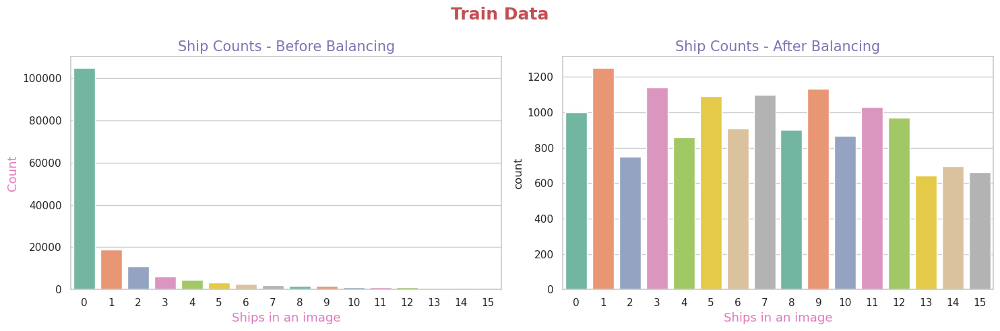

In [42]:
plt.figure(figsize = (15, 5))
plt.suptitle("Train Data", fontsize = 18, color = 'r', weight = 'bold')
plt.subplot(1, 2, 1)
# sns.set_theme(style="whitegrid")

sns.countplot(x=train_df.ships, palette = 'Set2')
plt.title("Ship Counts - Before Balancing", color = 'm', fontsize = 15)
plt.ylabel("Count", color = 'tab:pink', fontsize = 13)
plt.xlabel("Ships in an image", color = 'tab:pink', fontsize = 13)
plt.subplot(1, 2, 2)
sns.countplot(x=balanced_train_df.ships, palette = 'Set2')
plt.title("Ship Counts - After Balancing", color = 'm', fontsize = 15)
plt.xlabel("Ships in an image", color = 'tab:pink', fontsize = 13)
plt.tight_layout()

In [43]:
# Image and Mask Generator

def make_image_gen(in_df, batch_size = BATCH_SIZE):
    '''
    Inputs -
    in_df - data frame on which the function will be applied
    batch_size - number of training examples in one iteration
    '''
    all_batches = list(in_df.groupby('ImageId'))                             # Group ImageIds and create list of that dataframe
    out_rgb = []                                                             # Image list
    out_mask = []                                                            # Mask list
    while True:                                                              # Loop for every data
        np.random.shuffle(all_batches)                                       # Shuffling the data
        for c_img_id, c_masks in all_batches:                                # For img_id and msk_rle in all_batches
            rgb_path = os.path.join(train_image_dir, c_img_id)               # Get the img path
            c_img = imread(rgb_path)                                         # img array
            c_mask = masks_as_image(c_masks['EncodedPixels'].values)         # Create mask of rle data for each ship in an img
            out_rgb += [c_img]                                               # Append the current img in the out_rgb / img list
            out_mask += [c_mask]                                             # Append the current mask in the out_mask / mask list
            if len(out_rgb)>=batch_size:                                     # If length of list is more or equal to batch size then
                yield np.stack(out_rgb)/255.0, np.stack(out_mask)            # Yeild the scaled img array (b/w 0 and 1) and mask array (0 for bg and 1 for ship)
                out_rgb, out_mask=[], []                                     # Empty the lists to create another batch

In [44]:
# Generate train data

train_gen = make_image_gen(balanced_train_df)

# Image and Mask

train_x, train_y = next(train_gen)

# Print summary

print(f"train_x ~\nShape: {train_x.shape}\nMin value: {train_x.min()}\nMax value: {train_x.max()}")
print(f"\ntrain_y ~\nShape: {train_y.shape}\nMin value: {train_y.min()}\nMax value: {train_y.max()}")

train_x ~
Shape: (4, 768, 768, 3)
Min value: 0.0
Max value: 1.0

train_y ~
Shape: (4, 768, 768, 1)
Min value: 0
Max value: 1


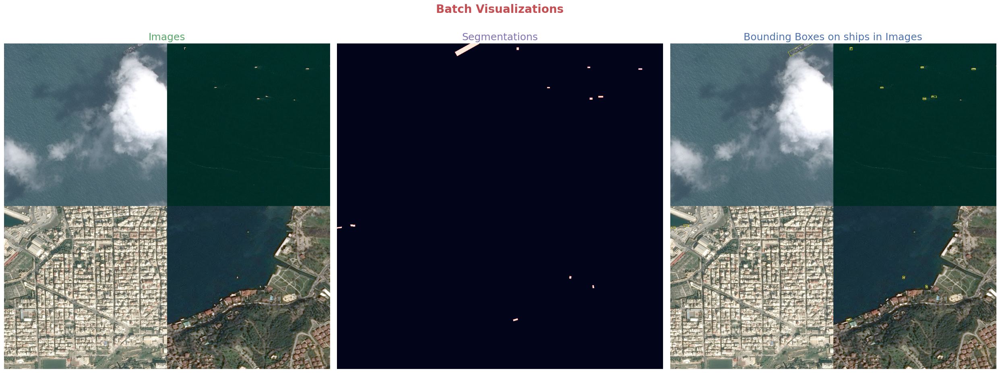

In [45]:
# Visulaising train batch

montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
batch_rgb = montage_rgb(train_x)                                                   # Create montage of img
batch_seg = montage(train_y[:, :, :, 0])                                           # Create montafe of msk
batch_overlap = mark_boundaries(batch_rgb, batch_seg.astype(int))                  # Create bounding box around ships in img
titles = ["Images", "Segmentations", "Bounding Boxes on ships in Images"]          # Titles for subplot
colors = ['g', 'm', 'b']                                                           # Colors to be used for title
display = [batch_rgb, batch_seg, batch_overlap]                                    # What to display in subplot
plt.figure(figsize=(25,10))                                                        # Generate figure 
for i in range(3):                                                                 # For i = 0, 1, 2, 3                           
    plt.subplot(1, 3, i+1)                                                         # Create subplot
    plt.imshow(display[i])                                                         # Display 
    plt.title(titles[i], fontsize = 18, color = colors[i])                         # Title 
    plt.axis('off')                                                                # Turn off the axis
plt.suptitle("Batch Visualizations", fontsize = 20, color = 'r', weight = 'bold')  # Add suptitle
plt.tight_layout()                                                                 # Layout for subplot

In [46]:
# Prepare validation data

valid_x, valid_y = next(make_image_gen(valid_df, VALID_IMG_COUNT))
print(f"valid_x ~\nShape: {valid_x.shape}\nMin value: {valid_x.min()}\nMax value: {valid_x.max()}")
print(f"\nvalid_y ~\nShape: {valid_y.shape}\nMin value: {valid_y.min()}\nMax value: {valid_y.max()}")

valid_x ~
Shape: (256, 768, 768, 3)
Min value: 0.0
Max value: 1.0

valid_y ~
Shape: (256, 768, 768, 1)
Min value: 0
Max value: 1


In [47]:
# Augmenting Data

from keras.preprocessing.image import ImageDataGenerator

# Preparing image data generator arguments

dg_args = dict(rotation_range = 15,            # Degree range for random rotations
               horizontal_flip = True,         # Randomly flips the inputs horizontally
               vertical_flip = True,           # Randomly flips the inputs vertically
               data_format = 'channels_last')  # channels_last refer to (batch, height, width, channels)

In [48]:
image_gen = ImageDataGenerator(**dg_args)
label_gen = ImageDataGenerator(**dg_args)

def create_aug_gen(in_gen, seed = None):
    '''
    Takes in -
    in_gen - train data generator, seed value
    '''
    np.random.seed(seed if seed is not None else np.random.choice(range(9999)))  # Randomly assign seed value if not provided
    for in_x, in_y in in_gen:                                                    # For imgs and msks in train data generator
        seed = 12                                                                # Seed value for imgs and msks must be same else augmentation won't be same
        
        # Create augmented imgs
        g_x = image_gen.flow(255*in_x,                                           # Inverse scaling on imgs for augmentation                                       
                             batch_size = in_x.shape[0],                         # batch_size = 3
                             seed = seed,                                        # Seed
                             shuffle=True)                                       # Shuffle the data
        
        # Create augmented masks
        g_y = label_gen.flow(in_y,
                             batch_size = in_x.shape[0],                       
                             seed = seed,                                         
                             shuffle=True)                                       
        
        '''Yeilds - augmented scaled imgs and msks array'''
        yield next(g_x)/255.0, next(g_y)

In [49]:
# Augment train data

cur_gen = create_aug_gen(train_gen, seed = 42)
t_x, t_y = next(cur_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())

x (4, 768, 768, 3) float32 0.0012695596 1.0
y (4, 768, 768, 1) float32 0.0 1.0


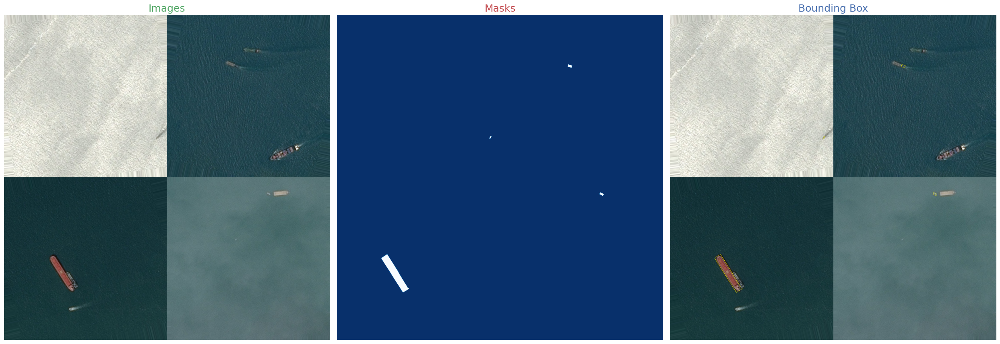

In [50]:
# Final Display before passing data into model

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (25, 10))
ax1.imshow(montage_rgb(t_x), cmap='gray')
ax1.set_title('Images', fontsize = 18, color = 'g')
ax1.axis('off')
ax2.imshow(montage(t_y[:, :, :, 0]), cmap='Blues_r')
ax2.set_title('Masks', fontsize = 18, color = 'r')
ax2.axis('off')
ax3.imshow(mark_boundaries(montage_rgb(t_x), montage(t_y[:, :, :, 0].astype(int))))
ax3.set_title('Bounding Box', fontsize = 18, color = 'b')
ax3.axis('off')
plt.tight_layout()

In [51]:
# Block all the garbage that has been generated
gc.collect()

130

In [52]:
# Build U-Net model

from keras import models, layers

# Conv2DTranspose upsampling
def upsample_conv(filters, kernel_size, strides, padding):
    return layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)
# Upsampling without Conv2DTranspose
def upsample_simple(filters, kernel_size, strides, padding):
    return layers.UpSampling2D(strides)

# Upsampling method choice
if UPSAMPLE_MODE=='DECONV':
    upsample=upsample_conv
else:
    upsample=upsample_simple

# Building the layers of UNET
input_img = layers.Input(t_x.shape[1:], name = 'RGB_Input')
pp_in_layer = input_img

# If NET_SCALING is defined then do the next step else continue ahead
if NET_SCALING is not None:
    pp_in_layer = layers.AvgPool2D(NET_SCALING)(pp_in_layer)

# To avoid overfitting and fastening the process of training
pp_in_layer = layers.GaussianNoise(GAUSSIAN_NOISE)(pp_in_layer) # Useful to mitigate overfitting
pp_in_layer = layers.BatchNormalization()(pp_in_layer)          # Allows using higher learning rate without causing problems with gradients


## Downsample (C-->C-->MP)

c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (pp_in_layer)
c1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c1)
p1 = layers.MaxPooling2D((2, 2)) (c1)

c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (p1)
c2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c2)
p2 = layers.MaxPooling2D((2, 2)) (c2)

c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (p2)
c3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c3)
p3 = layers.MaxPooling2D((2, 2)) (c3)

c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (p3)
c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c4)
p4 = layers.MaxPooling2D(pool_size=(2, 2)) (c4)


c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (p4)
c5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same') (c5)

## Upsample (U --> Concat --> C --> C)

u6 = upsample(64, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = layers.concatenate([u6, c4])
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (u6)
c6 = layers.Conv2D(64, (3, 3), activation='relu', padding='same') (c6)

u7 = upsample(32, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = layers.concatenate([u7, c3])
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (u7)
c7 = layers.Conv2D(32, (3, 3), activation='relu', padding='same') (c7)

u8 = upsample(16, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = layers.concatenate([u8, c2])
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (u8)
c8 = layers.Conv2D(16, (3, 3), activation='relu', padding='same') (c8)

u9 = upsample(8, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = layers.concatenate([u9, c1], axis=3)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (u9)
c9 = layers.Conv2D(8, (3, 3), activation='relu', padding='same') (c9)

d = layers.Conv2D(1, (1, 1), activation='sigmoid') (c9)
d = layers.Cropping2D((EDGE_CROP, EDGE_CROP))(d)
d = layers.ZeroPadding2D((EDGE_CROP, EDGE_CROP))(d)

if NET_SCALING is not None:
    d = layers.UpSampling2D(NET_SCALING)(d)

seg_model = models.Model(inputs=[input_img], outputs=[d])

seg_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 RGB_Input (InputLayer)         [(None, 768, 768, 3  0           []                               
                                )]                                                                
                                                                                                  
 gaussian_noise (GaussianNoise)  (None, 768, 768, 3)  0          ['RGB_Input[0][0]']              
                                                                                                  
 batch_normalization (BatchNorm  (None, 768, 768, 3)  12         ['gaussian_noise[0][0]']         
 alization)                                                                                       
                                                                                              

In [53]:
# Compute DICE coefficient, loss with BCE and compile the model

import keras.backend as K
from tensorflow.keras.optimizers import Adam
from keras.losses import binary_crossentropy

# Dice coeff
def dice_coef(y_true, y_pred, smooth=1):
    y_pred = tf.dtypes.cast(y_pred, tf.int32)
    y_true = tf.dtypes.cast(y_true, tf.int32)
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])                         # int = y_true ∩ y_pred
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])           # un = y_true_flatten ed ∪ y_pred_flattened
    return K.mean((2 * intersection + smooth) / (union + smooth), axis=0)       # dice = 2 * int + 1 / un + 1

# Dice with BCE
def dice_p_bce(y_true, y_pred, alpha=1e-2):
    """combine DICE and BCE"""
    combo_loss = alpha*binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)
    return combo_loss

ALPHA = 0.5 # < 0.5 penalises FP more, > 0.5 penalises FN more
CE_RATIO = 0.5 #weighted contribution of modified CE loss compared to Dice loss

def Combo_loss(y_true, y_pred, eps=1e-9, smooth=1):
    targets = tf.dtypes.cast(K.flatten(y_true), tf.float32)
    inputs = tf.dtypes.cast(K.flatten(y_pred), tf.float32)
    
    intersection = K.sum(targets * inputs)
    dice = (2. * intersection + smooth) / (K.sum(targets) + K.sum(inputs) + smooth)
    inputs = K.clip(inputs, eps, 1.0 - eps)
    out = - (ALPHA * ((targets * K.log(inputs)) + ((1 - ALPHA) * (1.0 - targets) * K.log(1.0 - inputs))))
    weighted_ce = K.mean(out, axis=-1)
    combo = (CE_RATIO * weighted_ce) - ((1 - CE_RATIO) * dice)
    
    return combo

def focal_loss_fixed(y_true, y_pred, gamma=2.0, alpha=0.25):
    pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
    pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
    focal_loss_fixed = -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1+K.epsilon())) - K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0 + K.epsilon()))
    return focal_loss_fixed

def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)

# Compile the model (learning_rate=1e-4)

opt = Adam(learning_rate=1e-4, weight_decay=1e-6)
seg_model.compile(optimizer=opt, loss=Combo_loss, metrics=[dice_coef, 'binary_accuracy'])

In [54]:
# Preparing Callbacks

from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau

# Best model weights
weight_path="{}_weights.best.hdf5".format('seg_model')

# Monitor validation dice coeff and save the best model weights
checkpoint = ModelCheckpoint(weight_path, monitor='val_dice_coef', verbose=1, save_best_only=True, mode='max', save_weights_only = True)

# Reduce Learning Rate on Plateau
reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_coef', factor=0.5, patience=3, verbose=1, mode='max', epsilon=0.0001, cooldown=2, min_lr=1e-6)

# Stop training once there is no improvement seen in the model
early = EarlyStopping(monitor="val_dice_coef", mode="max", patience=5)

# Callbacks ready
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [62]:
from keras import backend as K
gc.collect()
K.clear_session()

In [56]:
NB_EPOCHS = 1

# Finalizing steps per epoch
step_count = min(MAX_TRAIN_STEPS, balanced_train_df.shape[0]//BATCH_SIZE)

# Final augmented data being used in training
aug_gen = create_aug_gen(make_image_gen(balanced_train_df))

# Save loss history while training
loss_history = [seg_model.fit_generator(aug_gen, 
                             steps_per_epoch=step_count, 
                             epochs=NB_EPOCHS, 
                             validation_data=(valid_x, valid_y),
                             callbacks=callbacks_list, workers=1)] 

128/128 [==============================] - ETA: 0s - loss: 0.0239 - dice_coef: 0.1532 - binary_accuracy: 0.9945
Epoch 1: val_dice_coef improved from -inf to 0.77836, saving model to seg_model_weights.best.hdf5
128/128 [==============================] - 123s 822ms/step - loss: 0.0239 - dice_coef: 0.1532 - binary_accuracy: 0.9945 - val_loss: 0.0291 - val_dice_coef: 0.7784 - val_binary_accuracy: 0.9992 - lr: 1.0000e-04


In [57]:
# Save the weights to load it later for test data 
seg_model.load_weights(weight_path)
seg_model.save('seg_unet_model.h5')

In [58]:
def gen_pred(test_dir, img, model):
    rgb_path = os.path.join(test_image_dir,img)
    img = cv2.imread(rgb_path)
    img = img[::IMG_SCALING[0], ::IMG_SCALING[1]]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img/255
    img = tf.expand_dims(img, axis=0)
    pred = model.predict(img)
    pred = np.squeeze(pred, axis=0)
    return cv2.imread(rgb_path), pred

1/1 [==============================] - 0s 27ms/step


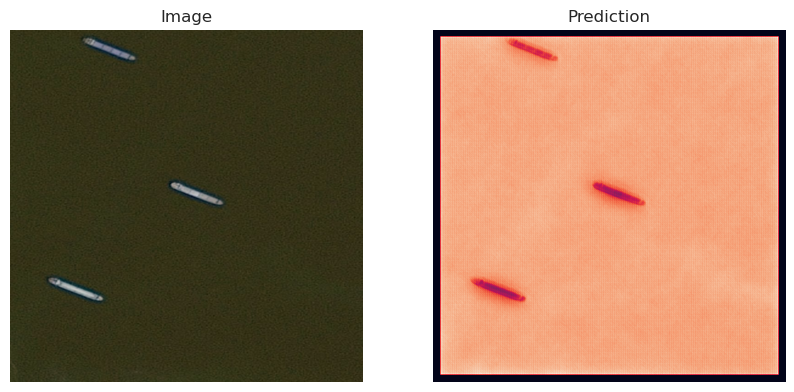

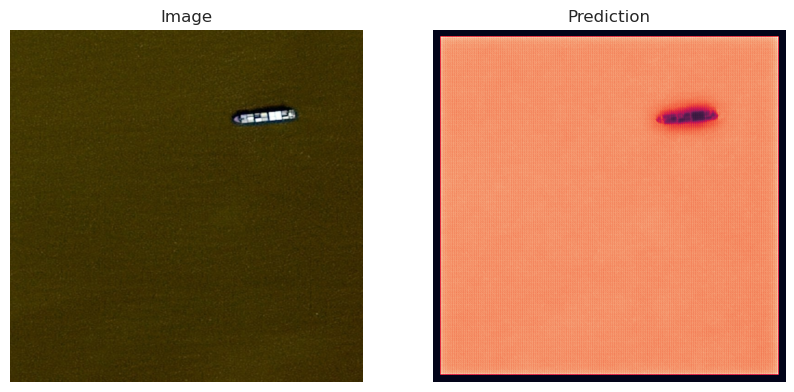

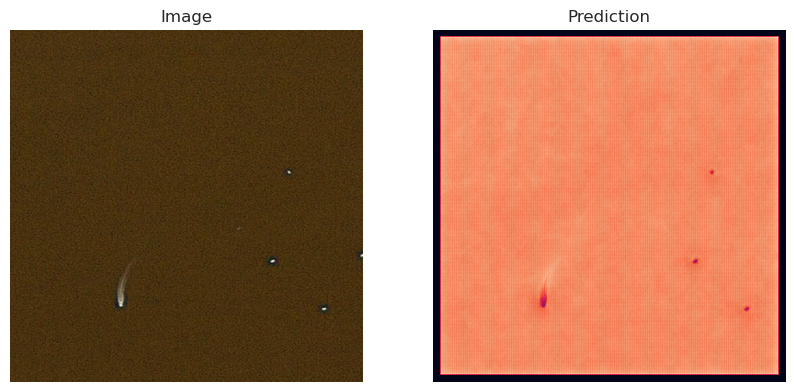

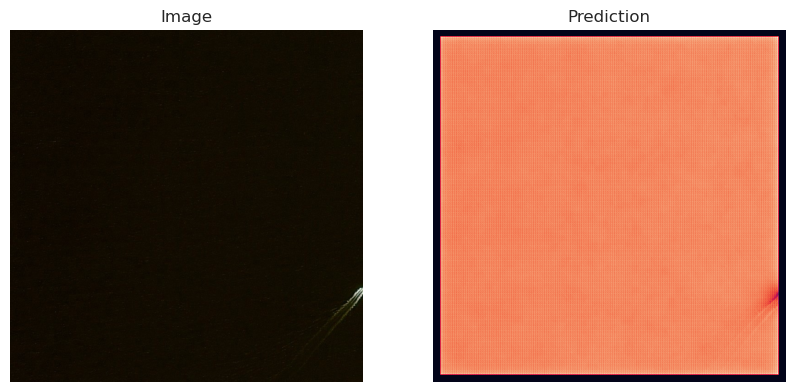

In [90]:
# Visualize some predictions

from matplotlib import pyplot as plt
test_imgs = ['00dc34840.jpg', '00c3db267.jpg', '00aa79c47.jpg', '011ee8cd9.jpg']
%matplotlib inline

rows = 1
columns = 2
for i in range(len(test_imgs)):
    img, pred = gen_pred(test_image_dir, test_imgs[i], seg_model)
    fig = plt.figure(figsize=(10, 7))
    fig.add_subplot(rows, columns, 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Image")
    fig.add_subplot(rows, columns, 2)
    plt.imshow(pred, interpolation='catrom')
    plt.axis('off')
    plt.title("Prediction")